<a href="https://colab.research.google.com/github/Yooru6/DeepDream-Lucid/blob/master/DeepDream_%26_Lucid.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# DeepDream and Lucid
used guide: <a>https://www.tensorflow.org/tutorials/generative/deepdream</a>

In [1]:
%tensorflow_version 1.x

TensorFlow 1.x selected.


## DeepDream

In [0]:
import tensorflow as tf

import numpy as np
import matplotlib as mpl
import IPython.display as display
import PIL.Image
from tensorflow.keras.preprocessing import image

### Download-, Process-, Show Image
- Defining functions

In [0]:
# Download an image and read it into a NumPy array.
def download(url, max_dim=None):
  name = url.split('/')[-1]
  image_path = tf.keras.utils.get_file(name, origin=url)
  img = PIL.Image.open(image_path)
  if max_dim:
    img.thumbnail((max_dim, max_dim))
  return np.array(img)

# Normalize an image
def deprocess(img):
  img = 255*(img + 1.0)/2.0
  return tf.cast(img, tf.uint8)

# Display an image
def show(img):
  display.display(PIL.Image.fromarray(np.array(img)))




### Image
- define location for picture
- show image

In [0]:
url = 'https://data.whicdn.com/images/334069406/original.jpg'

98304/93136 [===============================] - 0s 0us/step


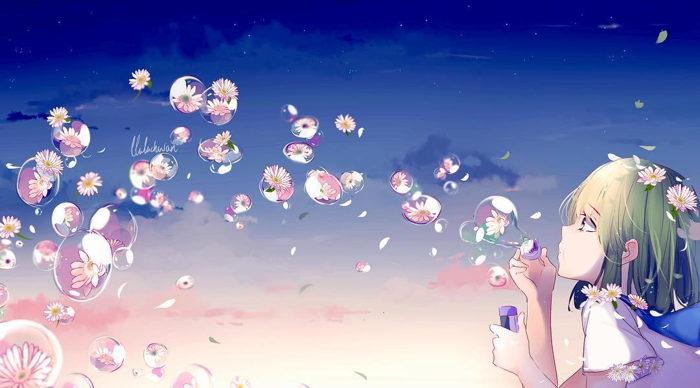

In [5]:
# Downsizing the image makes it easier to work with.
original_img = download(url, max_dim=700)
show(original_img)
display.display(display.HTML('Image cc-by: <a "https://scontent.fqlf1-1.fna.fbcdn.net/v/t1.0-0/p640x640/86698665_10222813728798337_2650333024536756224_o.jpg?_nc_cat=109&_nc_sid=85a577&_nc_ohc=5oRFSrXoQF8AX-ZJTjk&_nc_ht=scontent.fqlf1-1.fna&_nc_tp=6&oh=8d697027ae31f8c5367efd3ab4273971&oe=5EE49B78">Kantoku</a>'))

### Choose Model

In [0]:
base_model = tf.keras.applications.InceptionResNetV2(include_top=False, weights='imagenet')
#base_model = tf.keras.applications.InceptionV3(include_top=False, weights='imagenet')
#base_model = tf.keras.applications.Xception(include_top=False, weights='imagenet')

#Check model
#base_model.summary()

### Choose layers from model for DeepDream
- InceptionV3 model layers
- Xception model layers

In [0]:
# Maximize the activations of these layers
names = ['mixed3', 'mixed4']
names = ['block17_1_mixed', 'block17_19_mixed']

#names = ['block7_sepconv1', 'block11_sepconv1','block2_sepconv2']

layers = [base_model.get_layer(name).output for name in names]

# Create the feature extraction model
dream_model = tf.keras.Model(inputs=base_model.input, outputs=layers)

### Loss calucaltion
- In Deep dream we actually want maximize loss

In [0]:
def calc_loss(img, model):
  # Pass forward the image through the model to retrieve the activations.
  # Converts the image into a batch of size 1.
  img_batch = tf.expand_dims(img, axis=0)
  layer_activations = model(img_batch)
  if len(layer_activations) == 1:
    layer_activations = [layer_activations]

  losses = []
  for act in layer_activations:
    loss = tf.math.reduce_mean(act)
    losses.append(loss)

  return  tf.reduce_sum(losses)

### Deepdream class

In [0]:
class DeepDream(tf.Module):
  def __init__(self, model):
    self.model = model

  @tf.function(
      input_signature=(
        tf.TensorSpec(shape=[None,None,3], dtype=tf.float32),
        tf.TensorSpec(shape=[], dtype=tf.int32),
        tf.TensorSpec(shape=[], dtype=tf.float32),)
  )
  def __call__(self, img, steps, step_size):
      print("Tracing")
      loss = tf.constant(0.0)
      for n in tf.range(steps):
        with tf.GradientTape() as tape:
          # This needs gradients relative to `img`
          # `GradientTape` only watches `tf.Variable`s by default
          tape.watch(img)
          loss = calc_loss(img, self.model)

        # Calculate the gradient of the loss with respect to the pixels of the input image.
        gradients = tape.gradient(loss, img)

        # Normalize the gradients.
        gradients /= tf.math.reduce_std(gradients) + 1e-20 
        
        # In gradient ascent, the "loss" is maximized so that the input image increasingly "excites" the layers.
        # You can update the image by directly adding the gradients (because they're the same shape!)
        img = img + gradients*step_size
        img = tf.clip_by_value(img, -1, 1)

      return loss, img

In [0]:
def run_deep_dream_simple(img, steps=100, step_size=0.01):
  # Convert from uint8 to the range expected by the model.
  img = tf.keras.applications.inception_v3.preprocess_input(img)
  img = tf.convert_to_tensor(img)
  step_size = tf.convert_to_tensor(step_size)
  steps_remaining = steps
  step = 0
  while steps_remaining:
    if steps_remaining>100:
      run_steps = tf.constant(100)
    else:
      run_steps = tf.constant(steps_remaining)
    steps_remaining -= run_steps
    step += run_steps

    loss, img = deepdream(img, run_steps, tf.constant(step_size))
    
    display.clear_output(wait=True)
    show(deprocess(img))
    print ("Step {}, loss {}".format(step, loss))


  result = deprocess(img)
  display.clear_output(wait=True)
  show(result)

  return result

In [0]:
deepdream = DeepDream(dream_model)

### Basic deep dream:
- with octave
- gradient ascent approach

In [0]:
#dream_img = run_deep_dream_simple(img=original_img, 
 #                                 steps=100, step_size=0.01)

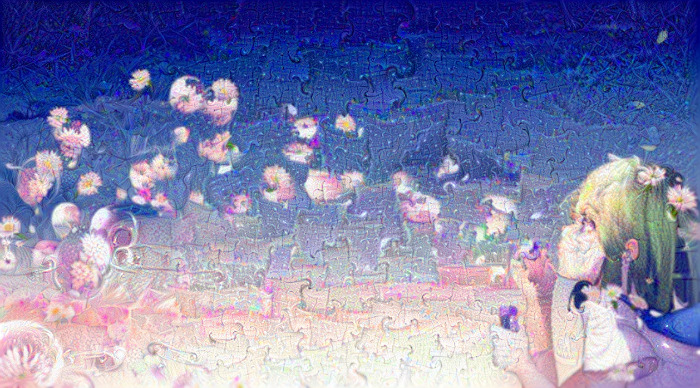

36.814356565475464

In [62]:
import random

x = random.uniform(1, 1.5)
import time
start = time.time()

OCTAVE_SCALE = 1.6

img = tf.constant(np.array(original_img))
base_shape = tf.shape(img)[:-1]
float_base_shape = tf.cast(base_shape, tf.float32)

for n in range(-3, 3):

  if n<2:
    new_shape = tf.cast(float_base_shape*(random.uniform(0.2, 1.5)**n), tf.int32)
  if n==2:
    new_shape = tf.cast(float_base_shape*(random.uniform(0.5, 2.0)**2), tf.int32)

  img = tf.image.resize(img, new_shape).numpy()

  img = run_deep_dream_simple(img=img, steps=50, step_size=0.01)

display.clear_output(wait=True)
img = tf.image.resize(img, base_shape)
img = tf.image.convert_image_dtype(img/255.0, dtype=tf.uint8)
show(img)

end = time.time()
end-start

### DeepDream with tiles & octave(Advanced)
- shifting image randomly
- using octave
- random shift

In [0]:
def random_roll(img, maxroll):
  # Randomly shift the image to avoid tiled boundaries.
  shift = tf.random.uniform(shape=[6], minval=-maxroll, maxval=maxroll, dtype=tf.int32)
  shift_down, shift_right = shift[0],shift[1] 
  img_rolled = tf.roll(tf.roll(img, shift_right, axis=1), shift_down, axis=0)
  return shift_down, shift_right, img_rolled

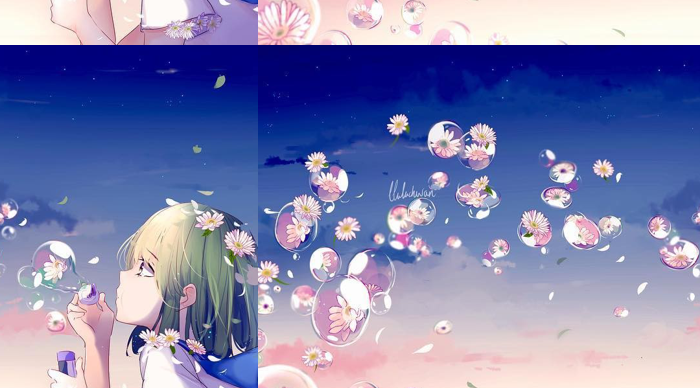

In [111]:
shift_down, shift_right, img_rolled = random_roll(np.array(original_img), 1024)
show(img_rolled)

#### TileGradients class

In [0]:
class TiledGradients(tf.Module):
  def __init__(self, model):
    self.model = model

  @tf.function(
      input_signature=(
        tf.TensorSpec(shape=[None,None,3], dtype=tf.float32),
        tf.TensorSpec(shape=[], dtype=tf.int32),)
  )
  def __call__(self, img, tile_size=1024):
    shift_down, shift_right, img_rolled = random_roll(img, tile_size)

    # Initialize the image gradients to zero.
    gradients = tf.zeros_like(img_rolled)
    
    # Skip the last tile, unless there's only one tile.
    xs = tf.range(0, img_rolled.shape[0], tile_size)[:-1]
    if not tf.cast(len(xs), bool):
      xs = tf.constant([0])
    ys = tf.range(0, img_rolled.shape[1], tile_size)[:-1]
    if not tf.cast(len(ys), bool):
      ys = tf.constant([0])

    for x in xs:
      for y in ys:
        # Calculate the gradients for this tile.
        with tf.GradientTape() as tape:
          # This needs gradients relative to `img_rolled`.
          # `GradientTape` only watches `tf.Variable`s by default.
          tape.watch(img_rolled)

          # Extract a tile out of the image.
          img_tile = img_rolled[x:x+tile_size, y:y+tile_size]
          loss = calc_loss(img_tile, self.model)

        # Update the image gradients for this tile.
        gradients = gradients + tape.gradient(loss, img_rolled)

    # Undo the random shift applied to the image and its gradients.
    gradients = tf.roll(tf.roll(gradients, -shift_right, axis=1), -shift_down, axis=0)

    # Normalize the gradients.
    gradients /= tf.math.reduce_std(gradients) + 1e-8 

    return gradients 

In [0]:
get_tiled_gradients = TiledGradients(dream_model)

#### Run Deepdream with tilegradients & octave

In [0]:
def run_deep_dream_with_octaves(img, steps_per_octave=100, step_size=0.015, 
                                octaves=range(-2,3), octave_scale=1.2):
  base_shape = tf.shape(img)
  img = tf.keras.preprocessing.image.img_to_array(img)
  img = tf.keras.applications.inception_v3.preprocess_input(img)

  initial_shape = img.shape[:-1]
  img = tf.image.resize(img, initial_shape)
  for octave in octaves:
    # Scale the image based on the octave
    new_size = tf.cast(tf.convert_to_tensor(base_shape[:-1]), tf.float32)*(octave_scale**octave)
    img = tf.image.resize(img, tf.cast(new_size, tf.int32))

    for step in range(steps_per_octave):
      gradients = get_tiled_gradients(img)
      img = img + gradients*step_size
      img = tf.clip_by_value(img, -1, 1)

      if step % 10 == 0:
        display.clear_output(wait=True)
        show(deprocess(img))
        print ("Octave {}, Step {}".format(octave, step))
    
  result = deprocess(img)
  return result

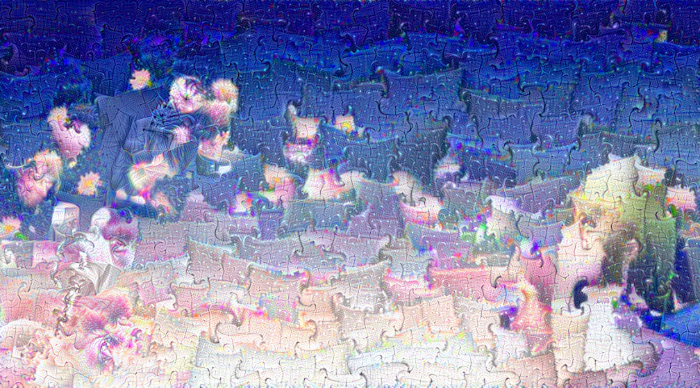

In [110]:
#create image
img = run_deep_dream_with_octaves(img=original_img, step_size=0.01)

display.clear_output(wait=True)
img = tf.image.resize(img, base_shape)
img = tf.image.convert_image_dtype(img/255.0, dtype=tf.uint8)
show(img)

## Lucid dream
- transfer styles between 2 images


In [0]:
!pip install -q lucid>=0.2.3

In [0]:
# Imports

import numpy as np
import tensorflow as tf

from lucid.modelzoo import vision_models
from lucid.misc.io import show, load, save
from lucid.misc.tfutil import create_session

import lucid.optvis.objectives as objectives
import lucid.optvis.param as param
import lucid.optvis.render as render

In [0]:
from lucid.optvis.objectives import wrap_objective

### Model

In [0]:
model = vision_models.InceptionV1()
model.load_graphdef()

In [373]:
tf.test.is_gpu_available()

True

### Images
- getImage()
  - edited function to work with tf lucid
    - checked return types from <a>https://github.com/tensorflow/lucid/blob/master/lucid/misc/io/loading.py</a>

In [0]:
def getImage(url, max_dim=None):
  name = url.split('/')[-1]
  image_path = tf.keras.utils.get_file(name, origin=url)
  img = PIL.Image.open(image_path)
  
  if max_dim:
    img.thumbnail((max_dim, max_dim))
  im=np.asarray(img)
  return (np.divide(im,255,dtype=np.float32))

(512, 512, 3) (576, 1024, 3)



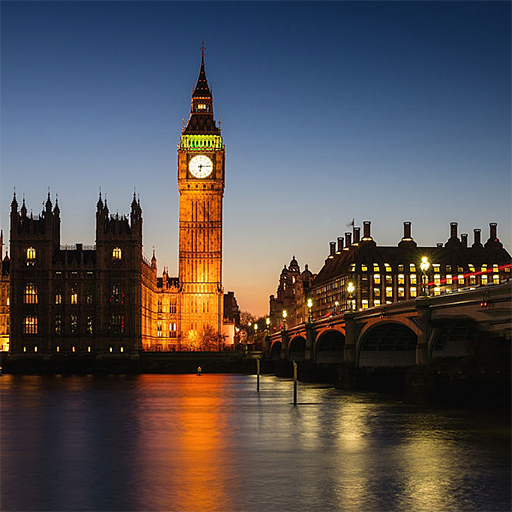


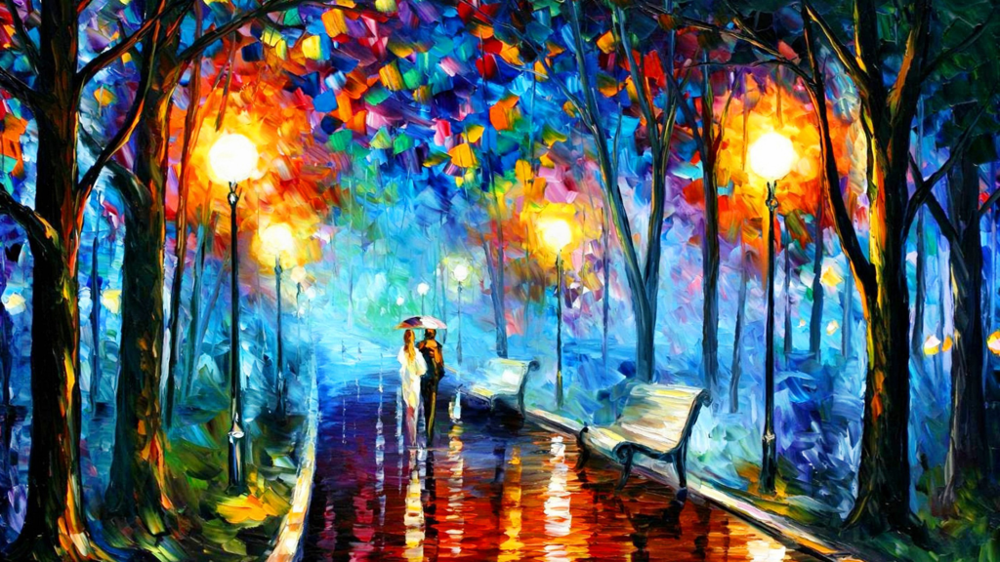

In [375]:
# first sample images
style_image = getImage('https://businessbrokercolorado.com/wp-content/uploads/2019/10/art.jpg',max_dim=1024)
content_image = getImage("https://storage.googleapis.com/tensorflow-lucid/static/img/notebook-styletransfer-bigben.jpg",max_dim=1024)

 

print(content_image.shape, style_image.shape)

show(content_image)
show(style_image)
#print(style_image)

### Choose layers for lucid
you can check shapes that layers capture from:<br>
<a> https://distill.pub/2017/feature-visualization/ </a> 

In [0]:
style_layers = [
  'conv2d2',
  'mixed3a',
  'mixed4a',
  'mixed4b',
  'mixed4c',
]

content_layers = [
  'mixed3b',
]

In [0]:
#Image stack
def style_transfer_param(content_image, style_image, decorrelate=True, fft=True):
  style_transfer_input = param.image(*content_image.shape[:2], decorrelate=decorrelate, fft=fft)[0]
  content_input = content_image
  style_input = tf.random_crop(style_image, content_image.shape)
  return tf.stack([style_transfer_input, content_input, style_input])

# these constants help remember which image is at which batch dimension
TRANSFER_INDEX = 0
CONTENT_INDEX = 1
STYLE_INDEX = 2

In [378]:
style_transfer_param(content_image, style_image).shape

TensorShape([Dimension(3), Dimension(512), Dimension(512), Dimension(3)])

### Loss / activation

In [379]:
#Loss affects greatly on generated images
def mean_L1(a, b):
  #abs returns always positive
  return tf.reduce_mean(tf.abs((a-b)))

'''' Optional loss functions
def mean_L1(a, b):
  #abs returns always positive
  return tf.reduce_mean(tf.abs(tf.square(a-b)))

def mean_L1(a, b):
  #abs returns always positive
  return tf.reduce_mean((tf.square(a-b)))'''

"' Optional loss functions\ndef mean_L1(a, b):\n  #abs returns always positive\n  return tf.reduce_mean(tf.abs(tf.square(a-b)))\n\ndef mean_L1(a, b):\n  #abs returns always positive\n  return tf.reduce_mean((tf.square(a-b)))"

In [0]:
@wrap_objective
def activation_difference(layer_names, activation_loss_f=mean_L1, transform_f=None, difference_to=CONTENT_INDEX):
  def inner(T):
    # first we collect the (constant) activations of image we're computing the difference to
    image_activations = [T(layer_name)[difference_to] for layer_name in layer_names]
    if transform_f is not None:
      image_activations = [transform_f(act) for act in image_activations]

    # we also set get the activations of the optimized image which will change during optimization
    optimization_activations = [T(layer)[TRANSFER_INDEX] for layer in layer_names]
    if transform_f is not None:
      optimization_activations = [transform_f(act) for act in optimization_activations]

    # we use the supplied loss function to compute the actual losses
    losses = [activation_loss_f(a, b) for a, b in zip(image_activations, optimization_activations)]
    return tf.add_n(losses)

  return inner

In [0]:
#Gram matrix for transforming activations before penalizing their difference
def gram_matrix(array, normalize_magnitue=True):
  channels = tf.shape(array)[-1]
  array_flat = tf.reshape(array, [-1, channels])
  gram_matrix = tf.matmul(array_flat, array_flat, transpose_a=True)
  if normalize_magnitue:
    length = tf.shape(array_flat)[0]
    gram_matrix /= tf.cast(length, tf.float32)
  return gram_matrix

### Make Lucid Image
- function which generate images

In [0]:
 def LucidImage(cont_image,sty_image):
  model = vision_models.InceptionV1()
  model.load_graphdef()
  style_transfer_param(content_image, style_image).shape

  param_f = lambda: style_transfer_param(cont_image, sty_image)

  content_obj = 100 * activation_difference(content_layers, difference_to=CONTENT_INDEX)
  content_obj.description = "Content Loss"

  style_obj = activation_difference(style_layers, transform_f=gram_matrix, difference_to=STYLE_INDEX)
  style_obj.description = "Style Loss"

  objective = - content_obj - style_obj


  vis = render.render_vis(model, objective, param_f=param_f, thresholds=[512], verbose=False, print_objectives=[content_obj, style_obj])[-1]
  show(vis)

### Testing
- Generating lucid images

#### Painting


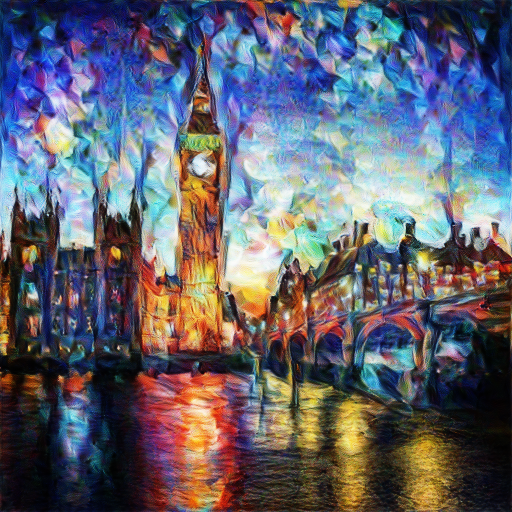
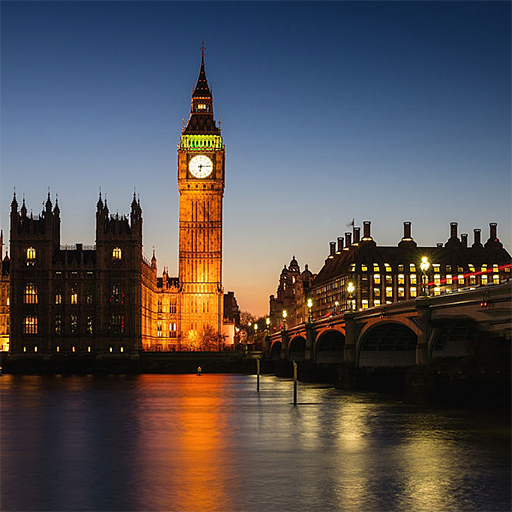
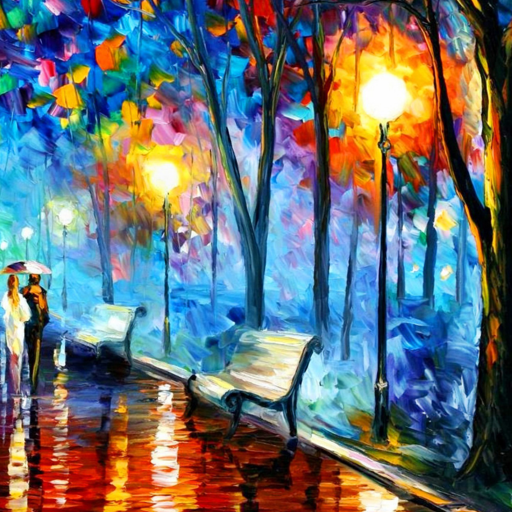

In [161]:
LucidImage(content_image,style_image)
#show(vis)

#### Dog

245760/240217 [==============================] - 0s 0us/step



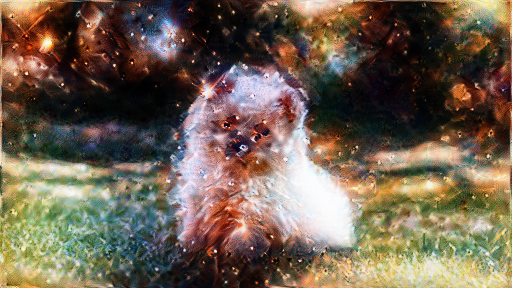
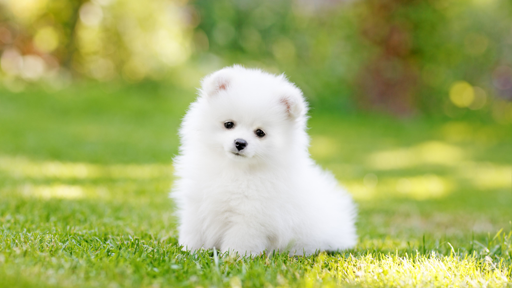
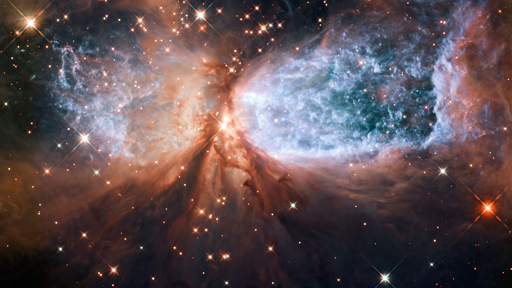

In [391]:
#Loss normal(a-b)
content_image=getImage('https://www.thesprucepets.com/thmb/mERLXPcXz4U9G702HlsORXJqZrU=/4231x2380/smart/filters:no_upscale()/adorable-white-pomeranian-puppy-spitz-921029690-5c8be25d46e0fb000172effe.jpg',max_dim=512)
style_image=getImage('https://cdn.spacetelescope.org/archives/images/screen/heic1118a.jpg',max_dim=512)[..., :3]
LucidImage(content_image,style_image)


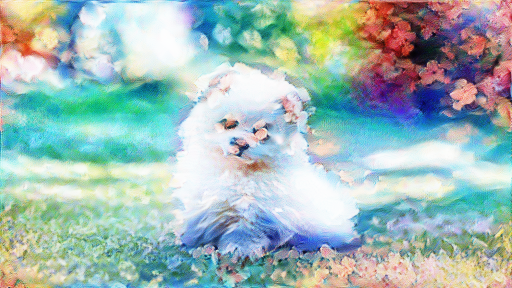
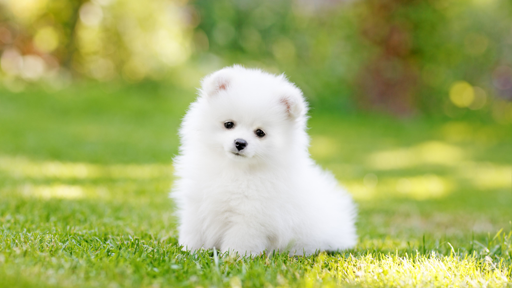
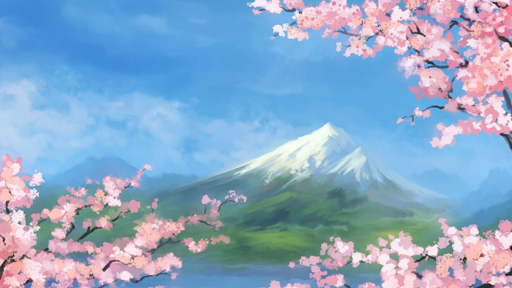

In [390]:
#Loss normal(a-b)
content_image=getImage('https://www.thesprucepets.com/thmb/mERLXPcXz4U9G702HlsORXJqZrU=/4231x2380/smart/filters:no_upscale()/adorable-white-pomeranian-puppy-spitz-921029690-5c8be25d46e0fb000172effe.jpg',max_dim=512)
style_image=getImage('https://i.pinimg.com/originals/ae/2e/cb/ae2ecb631f037846715e0c45609cbfb8.jpg',max_dim=512)[..., :3]
LucidImage(content_image,style_image)


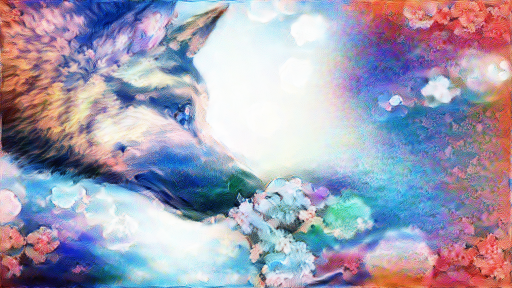
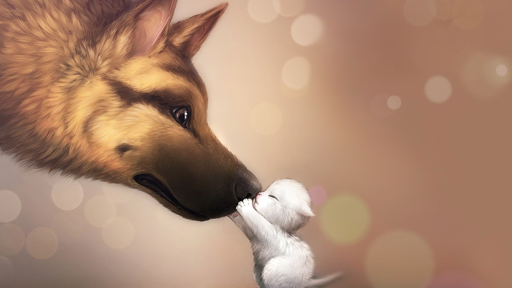
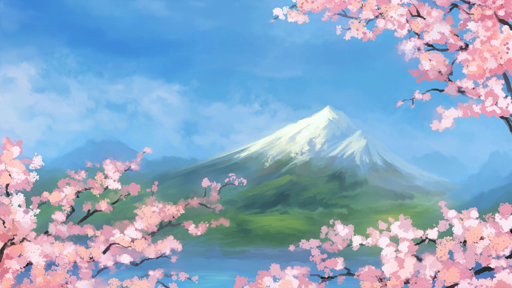

In [383]:
#Loss Normal
content_image=getImage('https://wallpaperaccess.com/full/434890.jpg',max_dim=512)
style_image=getImage('https://i.pinimg.com/originals/ae/2e/cb/ae2ecb631f037846715e0c45609cbfb8.jpg',max_dim=512)[..., :3]
LucidImage(content_image,style_image)


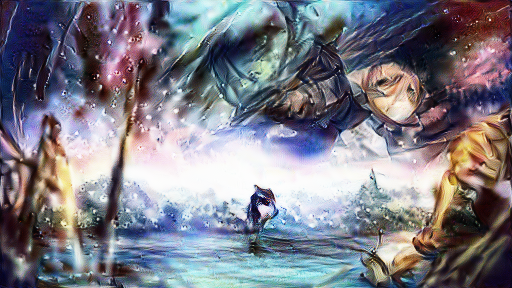
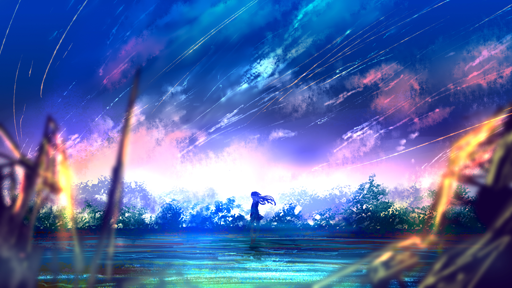
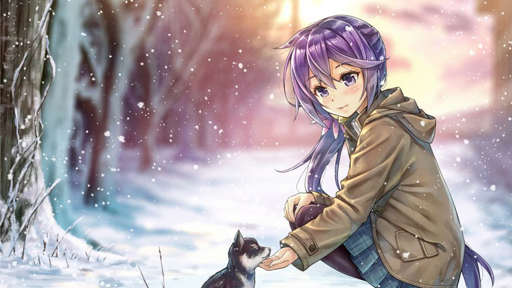

In [384]:
#Loss normal
content_image=getImage('https://www.itl.cat/pngfile/big/15-155444_wallpaper-anime-scenery-wallpaper-for-laptop.jpg',max_dim=512)
style_image=getImage('https://www.wallpaperup.com/uploads/wallpapers/2017/03/09/1081134/0c2bfb793b2e895b110011b6f397a0a6-700.jpg',max_dim=512)[..., :3]
LucidImage(content_image,style_image)

#### Scenery:


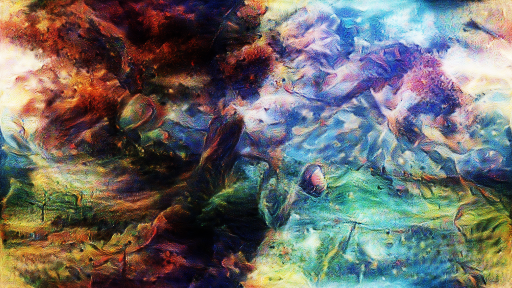
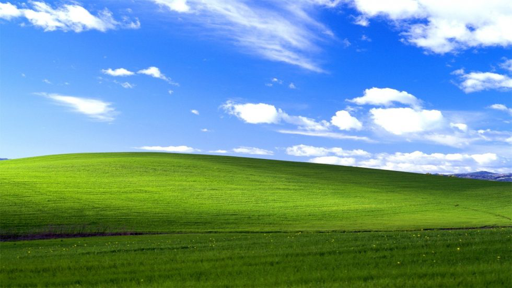
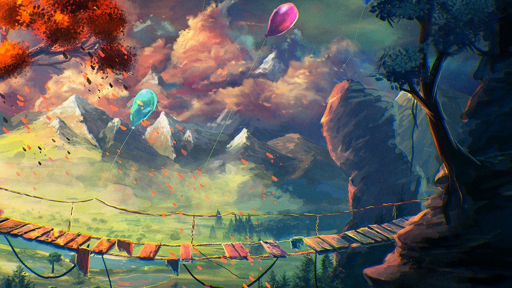

In [257]:
#Loss L1 = tf.abs(tf.square(a-b) as loss
content_image=getImage('https://opidesign.net/wp-content/uploads/landscape-architecture-fun-facts-outside-productions-blog-980x551.jpg',max_dim=512)

#content_image=getImage('https://www.selectadogbreed.com/media/1847/whiteswissshepherd_puppy.jpg',max_dim=512)
style_image=getImage('https://wallpaperaccess.com/full/12895.jpg',max_dim=784)
LucidImage(content_image,style_image)


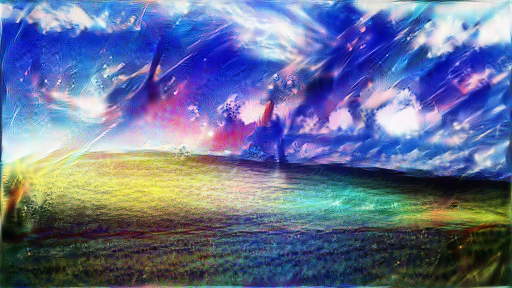
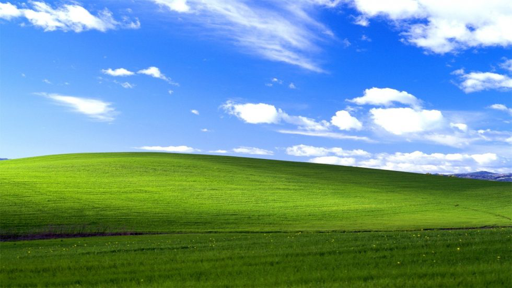
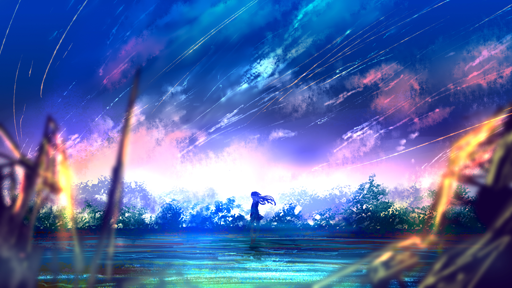

In [367]:
#Loss tf.abs(tf.square(a-b))
content_image=getImage('https://opidesign.net/wp-content/uploads/landscape-architecture-fun-facts-outside-productions-blog-980x551.jpg',max_dim=512)
style_image=getImage('https://www.itl.cat/pngfile/big/15-155444_wallpaper-anime-scenery-wallpaper-for-laptop.jpg',max_dim=512)[..., :3]
LucidImage(content_image,style_image)


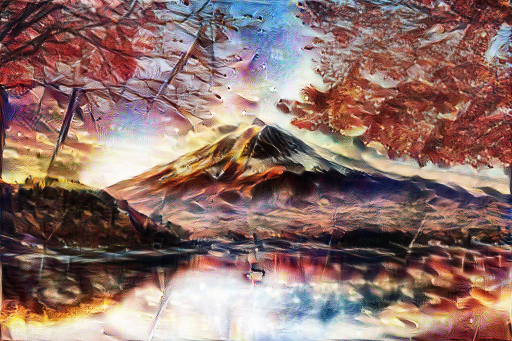
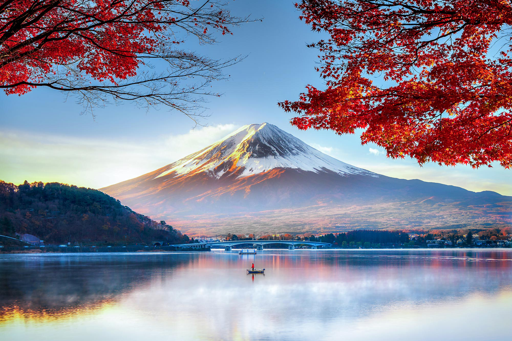
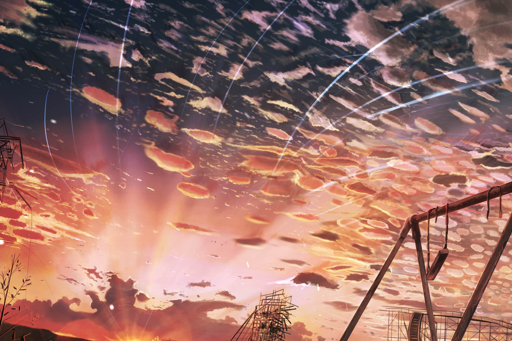

In [388]:
#Loss normal
content_image=getImage('https://cdn-image.departures.com/sites/default/files/1577142212/header-mt-fuji-MTFUJI1219.jpg',max_dim=512)
style_image=getImage('https://i.pinimg.com/originals/17/f5/f1/17f5f13b0cd8b9d5569de7f3bb326d53.jpg',max_dim=784)[..., :3]
LucidImage(content_image,style_image)


32768/24761 [=======================================] - 0s 0us/step



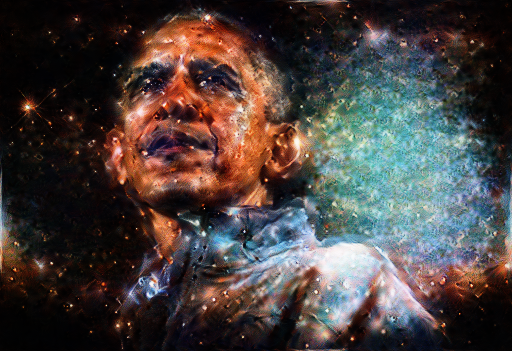
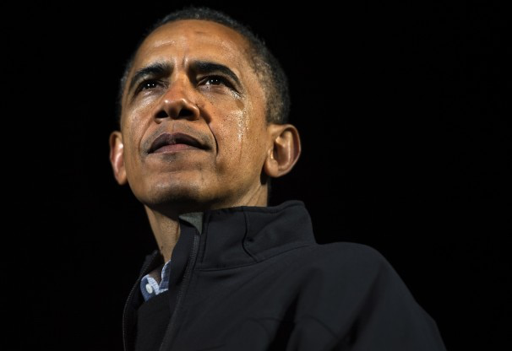
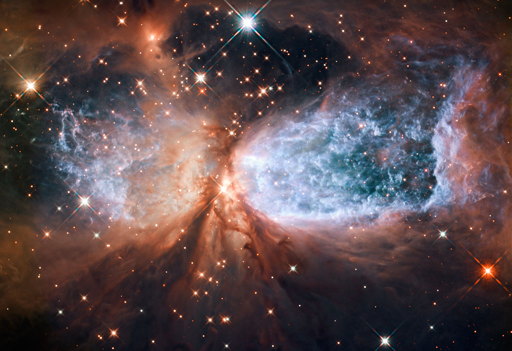

In [392]:
#Loss normal(a-b)
content_image=getImage('https://img.washingtonpost.com/rf/image_606w/2010-2019/WashingtonPost/2012/11/06/Others/Images/2012-11-06/OBAMA%204041352178673.JPG',max_dim=512)
style_image=getImage('https://cdn.spacetelescope.org/archives/images/screen/heic1118a.jpg',max_dim=512)[..., :3]
LucidImage(content_image,style_image)